In [1]:
import pygame
import sys

# Initialize Pygame
pygame.init()

# Set the default font
pygame.font.init()

# Define colors
WHITE = (255, 255, 255)
BLACK = (0, 0, 0)

screen_width, screen_height = 800, 600

class AirSphere:
    def __init__(self, size, mass, initial_position,velocity:list):
        self.size = size
        self.mass = mass
        self.position = list(initial_position)
        self.velocity = velocity
        self.radius = size // 2

    def draw(self, screen):
        pygame.draw.circle(screen, WHITE, (int(self.position[0]), int(self.position[1])), self.radius)

    def apply_force(self, force):
        # Calculate acceleration based on force and mass (F = ma)
        acceleration = [force[0] / self.mass, force[1] / self.mass]
        # Update velocity based on acceleration
        self.velocity[0] += acceleration[0]
        self.velocity[1] += acceleration[1]

    def update(self):
        # Update position based on velocity
        self.position[0] += self.velocity[0]
        self.position[1] += self.velocity[1]

    def check_collision(self, obj):
        # Calculate distance between centers of the two balls
        distance = ((self.position[0] - obj.position[0]) ** 2 + (self.position[1] - obj.position[1]) ** 2) ** 0.5
        if distance <= self.radius + obj.radius:  # If distance is less than sum of radii, collision occurs
            # Calculate penetration depth
            penetration = self.radius + obj.radius - distance
            # Calculate collision normal (direction from self to obj)
            collision_normal = [(obj.position[0] - self.position[0]) / distance, (obj.position[1] - self.position[1]) / distance]
            # Move self out of collision
            self.position[0] -= collision_normal[0] * penetration / 2
            self.position[1] -= collision_normal[1] * penetration / 2
            # Move obj out of collision
            obj.position[0] += collision_normal[0] * penetration / 2
            obj.position[1] += collision_normal[1] * penetration / 2
            # Calculate relative velocity
            relative_velocity = [self.velocity[0] - obj.velocity[0], self.velocity[1] - obj.velocity[1]]
            # Calculate dot product of relative velocity and collision normal
            dot_product = relative_velocity[0] * collision_normal[0] + relative_velocity[1] * collision_normal[1]
            # Calculate impulse scalar
            impulse_scalar = -2 * dot_product / (1 / self.mass + 1 / obj.mass)
            # Calculate impulse in collision normal direction
            impulse = [impulse_scalar * collision_normal[0], impulse_scalar * collision_normal[1]]
            # Update velocities of both balls
            self.velocity[0] += impulse[0] / self.mass
            self.velocity[1] += impulse[1] / self.mass
            obj.velocity[0] -= impulse[0] / obj.mass
            obj.velocity[1] -= impulse[1] / obj.mass





    def check_mouse_interaction(self):
        mouse_pos = pygame.mouse.get_pos()
        mouse_pressed = pygame.mouse.get_pressed()
        if mouse_pressed[0]:  # Left mouse button pressed
            # Calculate distance between mouse and center of the circle
            distance = ((self.position[0] - mouse_pos[0]) ** 2 + (self.position[1] - mouse_pos[1]) ** 2) ** 0.5
            if distance <= self.radius:
                # Move the circle to the mouse position
                self.position = list(mouse_pos)
                # Adjust position to prevent overlap
                self.position[0] = min(max(self.position[0], self.radius), screen_width - self.radius)
                self.position[1] = min(max(self.position[1], self.radius), screen_height - self.radius)




def main():
    
    screen = pygame.display.set_mode((screen_width, screen_height))
    clock = pygame.time.Clock()

    air_sphere = AirSphere(size=50, mass=10, initial_position=[200, 200],velocity=[1,0.9])
    obstacle = AirSphere(size=100, mass=100, initial_position=[400, 400],velocity=[0,0])

    while True:
        for event in pygame.event.get():
            if event.type == pygame.QUIT:
                pygame.quit()
                sys.exit()

        # Clear the screen
        screen.fill(BLACK)

        # Update air sphere
        air_sphere.update()
        # air_sphere.check_mouse_interaction()

        # Check collision with obstacle
        air_sphere.check_collision(obstacle)

        # Update obstacle
        obstacle.update()
        # obstacle.check_mouse_interaction()

        # Check collision with air sphere (reverse order)
        obstacle.check_collision(air_sphere)

        # Draw objects
        air_sphere.draw(screen)
        obstacle.draw(screen)

        # Refresh display
        pygame.display.flip()

        # Cap the frame rate
        clock.tick(60)

if __name__ == "__main__":
    main()

if __name__ == "__main__":
    main()

pygame 2.5.0 (SDL 2.28.0, Python 3.11.9)
Hello from the pygame community. https://www.pygame.org/contribute.html


SystemExit: 

C:\Users\Mario\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\interactiveshell.py:3516: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [2]:
import pygame
import sys
import numpy  as np

# Initialize Pygame
pygame.init()

# Set the default font
pygame.font.init()

# Define colors
WHITE = (255, 255, 255)
BLACK = (0, 0, 0)

screen_width, screen_height = 800, 600

class AirSphere:
    def __init__(self, size, mass, initial_position,velocity:list):
        self.size = size
        self.mass = mass
        self.position = list(initial_position)
        self.velocity = velocity
        self.radius = size // 2

    def draw(self, screen):
        pygame.draw.circle(screen, WHITE, (int(self.position[0]), int(self.position[1])), self.radius)

    def apply_force(self, force):
        # Calculate acceleration based on force and mass (F = ma)
        acceleration = [force[0] / self.mass, force[1] / self.mass]
        # Update velocity based on acceleration
        self.velocity[0] += acceleration[0]
        self.velocity[1] += acceleration[1]

    def update(self):
        # Update position based on velocity
        self.position[0] += self.velocity[0]
        self.position[1] += self.velocity[1]

    def check_collision(self, obj):
        # Calculate distance between centers of the two balls
        distance = ((self.position[0] - obj.position[0]) ** 2 + (self.position[1] - obj.position[1]) ** 2) ** 0.5
        if distance <= self.radius + obj.radius:  # If distance is less than sum of radii, collision occurs
            # Calculate penetration depth
            penetration = self.radius + obj.radius - distance
            # Calculate collision normal (direction from self to obj)
            collision_normal = [(obj.position[0] - self.position[0]) / distance, (obj.position[1] - self.position[1]) / distance]
            # Move self out of collision
            self.position[0] -= collision_normal[0] * penetration / 2
            self.position[1] -= collision_normal[1] * penetration / 2
            # Move obj out of collision
            obj.position[0] += collision_normal[0] * penetration / 2
            obj.position[1] += collision_normal[1] * penetration / 2
            # Calculate relative velocity
            relative_velocity = [self.velocity[0] - obj.velocity[0], self.velocity[1] - obj.velocity[1]]
            # Calculate dot product of relative velocity and collision normal
            dot_product = relative_velocity[0] * collision_normal[0] + relative_velocity[1] * collision_normal[1]
            # Calculate impulse scalar
            impulse_scalar = -2 * dot_product / (1 / self.mass + 1 / obj.mass)
            # Calculate impulse in collision normal direction
            impulse = [impulse_scalar * collision_normal[0], impulse_scalar * collision_normal[1]]
            # Update velocities of both balls
            self.velocity[0] += impulse[0] / self.mass
            self.velocity[1] += impulse[1] / self.mass
            obj.velocity[0] -= impulse[0] / obj.mass
            obj.velocity[1] -= impulse[1] / obj.mass





    def check_mouse_interaction(self):
        mouse_pos = pygame.mouse.get_pos()
        mouse_pressed = pygame.mouse.get_pressed()
        if mouse_pressed[0]:  # Left mouse button pressed
            # Calculate distance between mouse and center of the circle
            distance = ((self.position[0] - mouse_pos[0]) ** 2 + (self.position[1] - mouse_pos[1]) ** 2) ** 0.5
            if distance <= self.radius:
                # Move the circle to the mouse position
                self.position = list(mouse_pos)
                # Adjust position to prevent overlap
                self.position[0] = min(max(self.position[0], self.radius), screen_width - self.radius)
                self.position[1] = min(max(self.position[1], self.radius), screen_height - self.radius)




def create_air(n=100,size = 3,mass=0.5):
    air_praticals = []
    rand = np.random.random(n)
    for i in range(n):
        air_praticals.append (AirSphere(size=size, mass=mass, initial_position=[200+ (rand-0.5)*10, 200+ (rand-0.5)*10],velocity=[1+ (rand-0.5)/0.5,1+ (rand-0.5)/0.5]))

    





def main():
    
    screen = pygame.display.set_mode((screen_width, screen_height))
    clock = pygame.time.Clock()

    air_sphere = AirSphere(size=5, mass=1, initial_position=[200, 200],velocity=[1,0.9])
    obstacle = AirSphere(size=100, mass=1000, initial_position=[400, 400],velocity=[0,0])
    air = create_air()

    while True:
        for event in pygame.event.get():
            if event.type == pygame.QUIT:
                pygame.quit()
                sys.exit()

        # Clear the screen
        screen.fill(BLACK)

        # Update air sphere
        air_sphere.update()
        # air_sphere.check_mouse_interaction()

        # Check collision with obstacle
        air_sphere.check_collision(obstacle)

        # Update obstacle
        obstacle.update()
        # obstacle.check_mouse_interaction()

        # Check collision with air sphere (reverse order)
        obstacle.check_collision(air_sphere)

        # Draw objects
        air_sphere.draw(screen)
        obstacle.draw(screen)

        # Refresh display
        pygame.display.flip()

        # Cap the frame rate
        clock.tick(60)


if __name__ == "__main__":
    main()

SystemExit: 

C:\Users\Mario\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\interactiveshell.py:3516: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [124]:
import pygame
import sys
import numpy  as np

# Initialize Pygame
pygame.init()

# Set the default font
pygame.font.init()

# Define colors
WHITE = (255, 255, 255)
BLACK = (0, 0, 0)

screen_width, screen_height = 800, 600

class AirSphere:
    def __init__(self, size, mass, initial_position,velocity:list):
        self.size = size
        self.mass = mass
        self.position = list(initial_position)
        self.velocity = velocity
        self.radius = size // 2

    def draw(self, screen):
        pygame.draw.circle(screen, WHITE, (int(self.position[0]), int(self.position[1])), self.radius)

    def apply_force(self, force):
        # Calculate acceleration based on force and mass (F = ma)
        acceleration = [force[0] / self.mass, force[1] / self.mass]
        # Update velocity based on acceleration
        self.velocity[0] += acceleration[0]
        self.velocity[1] += acceleration[1]

    def update(self):
        # Update position based on velocity
        self.position[0] += self.velocity[0]
        self.position[1] += self.velocity[1]

    def check_collision(self, obj):
        # Calculate distance between centers of the two balls
        distance = ((self.position[0] - obj.position[0]) ** 2 + (self.position[1] - obj.position[1]) ** 2) ** 0.5
        print(distance)
        if distance <= self.radius + obj.radius:  # If distance is less than sum of radii, collision occurs
            # Calculate penetration depth
            penetration = self.radius + obj.radius - distance
            # Calculate collision normal (direction from self to obj)
            collision_normal = [(obj.position[0] - self.position[0]) / distance, (obj.position[1] - self.position[1]) / distance]
            # Move self out of collision
            self.position[0] -= collision_normal[0] * penetration / 2
            self.position[1] -= collision_normal[1] * penetration / 2
            # Move obj out of collision
            obj.position[0] += collision_normal[0] * penetration / 2
            obj.position[1] += collision_normal[1] * penetration / 2
            # Calculate relative velocity
            relative_velocity = [self.velocity[0] - obj.velocity[0], self.velocity[1] - obj.velocity[1]]
            # Calculate dot product of relative velocity and collision normal
            dot_product = relative_velocity[0] * collision_normal[0] + relative_velocity[1] * collision_normal[1]
            # Calculate impulse scalar
            impulse_scalar = -2 * dot_product / (1 / self.mass + 1 / obj.mass)
            # Calculate impulse in collision normal direction
            impulse = [impulse_scalar * collision_normal[0], impulse_scalar * collision_normal[1]]
            # Update velocities of both balls
            self.velocity[0] += impulse[0] / self.mass
            self.velocity[1] += impulse[1] / self.mass
            obj.velocity[0] -= impulse[0] / obj.mass
            obj.velocity[1] -= impulse[1] / obj.mass





    def check_mouse_interaction(self):
        mouse_pos = pygame.mouse.get_pos()
        mouse_pressed = pygame.mouse.get_pressed()
        if mouse_pressed[0]:  # Left mouse button pressed
            # Calculate distance between mouse and center of the circle
            distance = ((self.position[0] - mouse_pos[0]) ** 2 + (self.position[1] - mouse_pos[1]) ** 2) ** 0.5
            if distance <= self.radius:
                # Move the circle to the mouse position
                self.position = list(mouse_pos)
                # Adjust position to prevent overlap
                self.position[0] = min(max(self.position[0], self.radius), screen_width - self.radius)
                self.position[1] = min(max(self.position[1], self.radius), screen_height - self.radius)




def create_air(n=100,size = 3,mass=0.5):
    air_praticals = []
    rand = np.random.random([n,4])

    rand_pos_s = [200+ (rand[:,0]-0.5)*100, 200+(rand[:,1]-0.5)*100]
    rand_vel = [1+ (rand[:,2]-0.5),1+ (rand[:,3]-0.5)]

    # print(rand_pos_s,rand_vel)

    for i in range(n):
        air_praticals.append(AirSphere(size=size, mass=mass, initial_position=[rand_pos_s[0][i],rand_pos_s[1][i]],velocity=[rand_vel[0][i],rand_vel[1][i]]))
    
    return air_praticals

    





screen = pygame.display.set_mode((screen_width, screen_height))
clock = pygame.time.Clock()
obstacle = AirSphere(size=150, mass=150, initial_position=[400, 400],velocity=[-1,-1])
air = create_air(n=500,size=2
                 ,mass=0.1)
                 
while True:
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            pygame.quit()
            sys.exit()


    screen.fill(BLACK)

    obstacle.update()

    for i in air:
        i.update()
        i.check_collision(obstacle)
        obstacle.check_collision(i)
        i.draw(screen)

    


    # Draw objects
    
    obstacle.draw(screen)

    # Refresh display
    pygame.display.flip()

    # Cap the frame rate
    clock.tick(60)


216.2322234786899
216.2322234786899
243.99819517480634
243.99819517480634
311.0543114570217
311.0543114570217
240.51902527081842
240.51902527081842
303.3795805847585
303.3795805847585
245.79402880515514
245.79402880515514
228.02234029983566
228.02234029983566
324.01608213240945
324.01608213240945
332.23687356705443
332.23687356705443
291.2993568264237
291.2993568264237
296.7595006681406
296.7595006681406
294.3875417262286
294.3875417262286
317.11763845549297
317.11763845549297
322.22156333383225
322.22156333383225
300.79513799533305
300.79513799533305
291.0594678241562
291.0594678241562
321.7105867546465
321.7105867546465
237.73703563512822
237.73703563512822
326.54829215383444
326.54829215383444
247.5689224315186
247.5689224315186
298.2433872604045
298.2433872604045
314.77798718181043
314.77798718181043
320.66050581660204
320.66050581660204
259.29208867842186
259.29208867842186
287.18976584472085
287.18976584472085
335.33935776469707
335.33935776469707
281.2015343935192
281.2015343935

SystemExit: 

C:\Users\Mario\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\interactiveshell.py:3516: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [28]:
import pygame
import sys
import numpy as np

# Initialize Pygame
pygame.init()

# Set the default font
pygame.font.init()
screen_width, screen_height = 800, 600
screen = pygame.display.set_mode((screen_width, screen_height))
clock = pygame.time.Clock()


# Define colors
WHITE = (255, 255, 255)
BLACK = (0, 0, 0)



class AirSphere:
    def __init__(self, size, mass, initial_position, velocity):
        self.size = size
        self.mass = mass
        self.position =initial_position
        self.velocity = velocity
        self.radius = size // 2


    def draw(self, screen):
        pygame.draw.circle(screen, WHITE, (int(self.position[0]), int(self.position[1])), self.radius)

    def update(self):
        # Update position based on velocity
        self.position[0] += self.velocity[0]
        self.position[1] += self.velocity[1]

    def check_collision(self, obj):
        # Calculate distance between centers of the two balls
        distance = ((self.position[0] - obj.position[0]) ** 2 + (self.position[1] - obj.position[1]) ** 2) ** 0.5
        if distance <= self.radius + obj.radius:  # If distance is less than sum of radii, collision occurs
            # Calculate penetration depth
            penetration = self.radius + obj.radius - distance
            # Calculate collision normal (direction from self to obj)
            collision_normal = [(obj.position[0] - self.position[0]) / distance, (obj.position[1] - self.position[1]) / distance]
            # Move self out of collision
            self.position[0] -= collision_normal[0] * penetration / 2
            self.position[1] -= collision_normal[1] * penetration / 2
            # Move obj out of collision
            obj.position[0] += collision_normal[0] * penetration / 2
            obj.position[1] += collision_normal[1] * penetration / 2
            # Calculate relative velocity
            relative_velocity = [self.velocity[0] - obj.velocity[0], self.velocity[1] - obj.velocity[1]]
            # Calculate dot product of relative velocity and collision normal
            dot_product = relative_velocity[0] * collision_normal[0] + relative_velocity[1] * collision_normal[1]
            # Calculate impulse scalar
            impulse_scalar = -2 * dot_product / (1 / self.mass + 1 / obj.mass)
            # Calculate impulse in collision normal direction
            impulse = [impulse_scalar * collision_normal[0], impulse_scalar * collision_normal[1]]
            # Update velocities of both balls
            self.velocity[0] += impulse[0] / self.mass
            self.velocity[1] += impulse[1] / self.mass
            obj.velocity[0] -= impulse[0] / obj.mass
            obj.velocity[1] -= impulse[1] / obj.mass
            # Reset the object's velocity to its original velocity after collision
            # obj.velocity = obj.original_velocity

    def check_mouse_interaction(self):
        mouse_pos = pygame.mouse.get_pos()
        mouse_pressed = pygame.mouse.get_pressed()
        if mouse_pressed[0]:  # Left mouse button pressed
            # Calculate distance between mouse and center of the circle
            distance = ((self.position[0] - mouse_pos[0]) ** 2 + (self.position[1] - mouse_pos[1]) ** 2) ** 0.5
            if distance <= self.radius:
                # Move the circle to the mouse position
                self.position = list(mouse_pos)
                # Adjust position to prevent overlap
                self.position[0] = min(max(self.position[0], self.radius), screen_width - self.radius)
                self.position[1] = min(max(self.position[1], self.radius), screen_height - self.radius)


def create_air(n=100, size=3, mass=0.5):
    air_particles = []
    rand = np.random.random([n, 4])

    rand_pos_s = [200 + (rand[:, 0] - 0.5) * 200, 200 + (rand[:, 1] - 0.5) * 200]
    rand_vel = [1.5 + (rand[:, 2] - 0.5), 1.5 + (rand[:, 3] - 0.5)]

    for i in range(n):
        air_particles.append(AirSphere(size=size, mass=mass, initial_position=[rand_pos_s[0][i], rand_pos_s[1][i]], velocity=[rand_vel[0][i], rand_vel[1][i]]))

    return air_particles

# Rest of your code remains the same

# Create an obstacle and air particles
obstacle = AirSphere(size=150, mass=1500, initial_position=[400, 400], velocity=[0.25, 0.25])
air = create_air(n=1000, size=2, mass=0.01)



done = False
screen.fill(BLACK)
# Main game loop (unchanged)
while True:
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            pygame.quit()
            sys.exit()

    screen.fill(BLACK)

    obstacle.update()

    for i in air:
        i.update()
        i.check_collision(obstacle)
        # obstacle.check_collision(i)
        i.draw(screen)
        # obstacle.draw(screen)

    # Draw objects
    obstacle.draw(screen)

    # Refresh display
    pygame.display.flip()

    # Cap the frame rate
    clock.tick(60)

SystemExit: 

In [1]:
import pygame
import sys
import numpy as np

# Initialize Pygame
pygame.init()

# Set the default font
pygame.font.init()
screen_width, screen_height = 800, 600
screen = pygame.display.set_mode((screen_width, screen_height))
clock = pygame.time.Clock()


# Define colors
WHITE = (255, 255, 255)
BLACK = (0, 0, 0)



class AirSphere:
    def __init__(self, size, mass, initial_position, velocity):
        self.size = size
        self.mass = mass
        self.position = np.array(initial_position,dtype = 'float')
        self.velocity = np.array(velocity,dtype = 'float')
        self.radius = size // 2

    def draw(self, screen):
        pygame.draw.circle(screen, WHITE, (int(self.position[0]), int(self.position[1])), self.radius)

    def update(self):
        # Update position based on velocity
        self.position += self.velocity

    def check_collision(self, obj):
        # Calculate relative position and distance
        relative_position = obj.position - self.position
        distance = np.linalg.norm(relative_position)
        if distance <= self.radius + obj.radius:  # If distance is less than sum of radii, collision occurs
            # Calculate collision normal (direction from self to obj)
            collision_normal = relative_position / distance
            # Calculate relative velocity
            relative_velocity = self.velocity - obj.velocity
            # Calculate impulse scalar
            impulse_scalar = -2 * np.dot(relative_velocity, collision_normal) / (1 / self.mass + 1 / obj.mass)
            # Calculate impulse in collision normal direction
            impulse = impulse_scalar * collision_normal
            # Update velocities of both spheres
            self.velocity += impulse / self.mass
            obj.velocity -= impulse / obj.mass

    def check_mouse_interaction(self):
        mouse_pos = pygame.mouse.get_pos()
        mouse_pressed = pygame.mouse.get_pressed()
        if mouse_pressed[0]:  # Left mouse button pressed
            # Calculate distance between mouse and center of the sphere
            distance_vector = np.array(mouse_pos) - self.position
            distance = np.linalg.norm(distance_vector)
            if distance <= self.radius:
                # Move the sphere to the mouse position
                self.position = np.array(mouse_pos)
                # Adjust position to prevent overlap
                self.position[0] = np.clip(self.position[0], self.radius, screen_width - self.radius)
                self.position[1] = np.clip(self.position[1], self.radius, screen_height - self.radius)



def create_air(n=100, size=3, mass=0.5):
    air_particles = []
    rand = np.random.random([n, 4])

    rand_pos_s = [100 + (rand[:, 0] - 0.5) * (200*np.sqrt(n/300)), 100 + (rand[:, 1] - 0.5) * 200*np.sqrt(n/300)]
    rand_vel = [1.5 + (rand[:, 2] - 0.5), 1.5 + (rand[:, 3] - 0.5)]

    for i in range(n):
        air_particles.append(AirSphere(size=size, mass=mass, initial_position=[rand_pos_s[0][i], rand_pos_s[1][i]], velocity=[rand_vel[0][i], rand_vel[1][i]]))

    return air_particles



def draw_fps():
    font = pygame.font.SysFont(None, 30)  # Choose font and font size
    fps = int(clock.get_fps())
    fps_text = f"FPS: {fps}"  # Get current FPS and convert to string
    if fps>30:
        text_surface = font.render(fps_text, True, pygame.Color('green'))  # Render FPS text
    elif fps>15:
        text_surface = font.render(fps_text, True, pygame.Color('yellow'))  # Render FPS text
    else:
        text_surface = font.render(fps_text, True, pygame.Color('red'))  # Render FPS text

    screen.blit(text_surface, (screen_width - text_surface.get_width() - 10, 10))  # Draw FPS text at top right corner




# Create an obstacle and air particles
obstacle = AirSphere(size=150, mass=150, initial_position=[400, 400], velocity=[-0.25, -0.25])
air = create_air(n=5000, size=2, mass=0.01)



done = False
screen.fill(BLACK)
# Main game loop (unchanged)
while True:
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            pygame.quit()
            sys.exit()
    
    

    screen.fill(BLACK)

    obstacle.update()


    for i in air:
        i.update()
        i.check_collision(obstacle)
        # obstacle.check_collision(i)
        i.draw(screen)
        # obstacle.draw(screen)\

    

    # Draw objects
    obstacle.draw(screen)
    draw_fps()

    # Refresh display
    pygame.display.flip()

    # Cap the frame rate
    clock.tick(60)

pygame 2.5.0 (SDL 2.28.0, Python 3.11.9)
Hello from the pygame community. https://www.pygame.org/contribute.html


SystemExit: 

C:\Users\Mario\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\interactiveshell.py:3516: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [1]:
import pygame
import sys
import numpy as np

# Initialize Pygame
pygame.init()

# Set the default font
pygame.font.init()
screen_width, screen_height = 800, 600
screen = pygame.display.set_mode((screen_width, screen_height))
clock = pygame.time.Clock()


# Define colors
WHITE = (255, 255, 255)
BLACK = (0, 0, 0)



class AirSphere:
    def __init__(self, size, mass, initial_position, velocity):
        self.size = size
        self.mass = mass
        self.position = np.array(initial_position,dtype = 'float')
        self.velocity = np.array(velocity,dtype = 'float')
        self.radius = size // 2

    def draw(self, screen):
        pygame.draw.circle(screen, WHITE, (int(self.position[0]), int(self.position[1])), self.radius)

    def update(self):
        # Update position based on velocity
        self.position += self.velocity

    def check_collision(self, obj):
        # Calculate relative position and distance
        relative_position = obj.position - self.position
        distance = np.linalg.norm(relative_position)
        if distance <= self.radius + obj.radius:  # If distance is less than sum of radii, collision occurs
            # Calculate collision normal (direction from self to obj)
            collision_normal = relative_position / distance
            # Calculate relative velocity
            relative_velocity = self.velocity - obj.velocity
            # Calculate impulse scalar
            impulse_scalar = -2 * np.dot(relative_velocity, collision_normal) / (1 / self.mass + 1 / obj.mass)
            # Calculate impulse in collision normal direction
            impulse = impulse_scalar * collision_normal
            # Update velocities of both spheres
            self.velocity += impulse / self.mass
            obj.velocity -= impulse / obj.mass

    def check_mouse_interaction(self):
        mouse_pos = pygame.mouse.get_pos()
        mouse_pressed = pygame.mouse.get_pressed()
        if mouse_pressed[0]:  # Left mouse button pressed
            # Calculate distance between mouse and center of the sphere
            distance_vector = np.array(mouse_pos) - self.position
            distance = np.linalg.norm(distance_vector)
            if distance <= self.radius:
                # Move the sphere to the mouse position
                self.position = np.array(mouse_pos)
                # Adjust position to prevent overlap
                self.position[0] = np.clip(self.position[0], self.radius, screen_width - self.radius)
                self.position[1] = np.clip(self.position[1], self.radius, screen_height - self.radius)



def create_air(n=100, size=3, mass=0.5):
    air_particles = []
    rand = np.random.random([n, 4])

    rand_pos_s = [100 + (rand[:, 0] - 0.5) * (200*np.sqrt(n/300)), 100 + (rand[:, 1] - 0.5) * 200*np.sqrt(n/300)]
    rand_vel = [1.5 + (rand[:, 2] - 0.5), 1.5 + (rand[:, 3] - 0.5)]

    for i in range(n):
        air_particles.append(AirSphere(size=size, mass=mass, initial_position=[rand_pos_s[0][i], rand_pos_s[1][i]], velocity=[rand_vel[0][i], rand_vel[1][i]]))

    return air_particles



def draw_fps():
    font = pygame.font.SysFont(None, 30)  # Choose font and font size
    fps = int(clock.get_fps())
    fps_text = f"FPS: {fps}"  # Get current FPS and convert to string
    if fps>30:
        text_surface = font.render(fps_text, True, pygame.Color('green'))  # Render FPS text
    elif fps>15:
        text_surface = font.render(fps_text, True, pygame.Color('yellow'))  # Render FPS text
    else:
        text_surface = font.render(fps_text, True, pygame.Color('red'))  # Render FPS text

    screen.blit(text_surface, (screen_width - text_surface.get_width() - 10, 10))  # Draw FPS text at top right corner




# Create an obstacle and air particles
obstacle = AirSphere(size=150, mass=150, initial_position=[400, 400], velocity=[-0.25, -0.25])
air = create_air(n=5000, size=2, mass=0.01)

def colide(i):
    i.update()
    i.check_collision(obstacle)
    # obstacle.check_collision(i)
    i.draw(screen)

v_colide = np.vectorize(colide)

done = False
screen.fill(BLACK)
# Main game loop (unchanged)
while True:
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            pygame.quit()
            sys.exit()
    
    

    screen.fill(BLACK)

    obstacle.update()





    for i in air:
        colide(i)
    

    # Draw objects
    obstacle.draw(screen)
    draw_fps()

    # Refresh display
    pygame.display.flip()

    # Cap the frame rate
    clock.tick(60)

pygame 2.5.0 (SDL 2.28.0, Python 3.11.9)
Hello from the pygame community. https://www.pygame.org/contribute.html


SystemExit: 

C:\Users\Mario\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\interactiveshell.py:3516: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


## Test numpy vectorize()
with the same everything except we use  
- colide
- v_colide
### WITHOUT NUMPY VECTORIZE
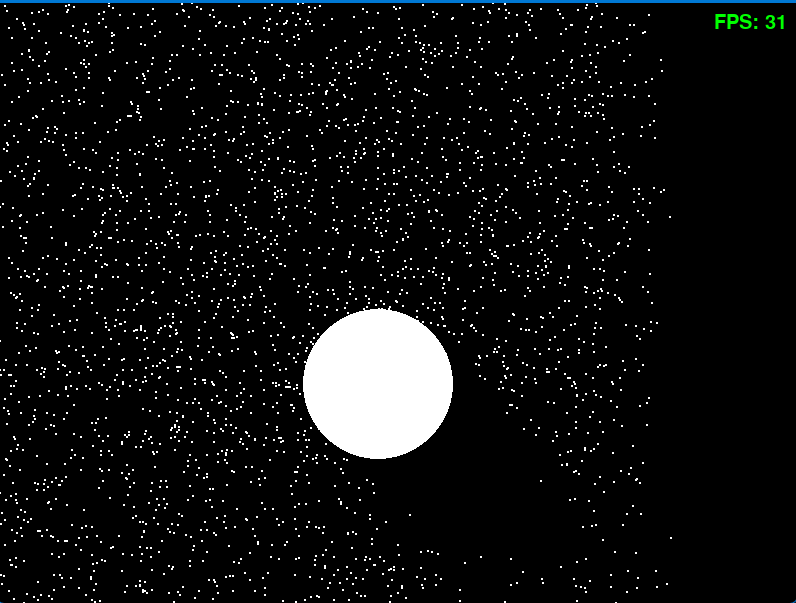


### NUMPY VECTORIZE FUNCTION 
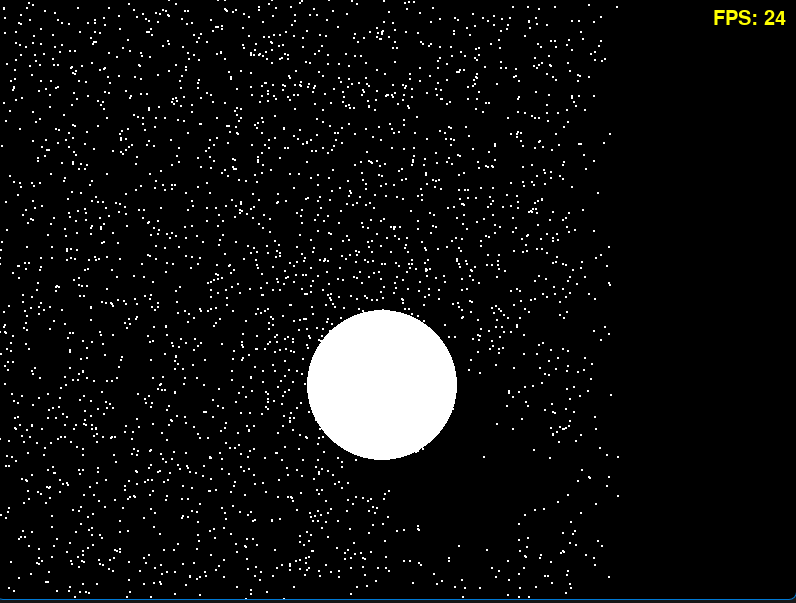

In [1]:
import pygame
import sys
import numpy as np

# Initialize Pygame
pygame.init()

# Set the default font
pygame.font.init()
screen_width, screen_height = 800, 600
screen = pygame.display.set_mode((screen_width, screen_height))
clock = pygame.time.Clock()


# Define colors
WHITE = (255, 255, 255)
BLACK = (0, 0, 0)



class AirSphere:
    def __init__(self, size, mass, initial_position, velocity):
        self.size = size
        self.mass = mass
        self.position = np.array(initial_position,dtype = 'float')
        self.velocity = np.array(velocity,dtype = 'float')
        self.radius = size // 2

    def draw(self, screen):
        pygame.draw.circle(screen, WHITE, (int(self.position[0]), int(self.position[1])), self.radius)

    def update(self):
        # Update position based on velocity
        self.position += self.velocity

    def check_collision(self, obj):
        # Calculate relative position and distance
        relative_position = obj.position - self.position
        distance = np.linalg.norm(relative_position)
        if distance <= self.radius + obj.radius:  # If distance is less than sum of radii, collision occurs
            # Calculate collision normal (direction from self to obj)
            collision_normal = relative_position / distance
            # Calculate relative velocity
            relative_velocity = self.velocity - obj.velocity
            # Calculate impulse scalar
            impulse_scalar = -2 * np.dot(relative_velocity, collision_normal) / (1 / self.mass + 1 / obj.mass)
            # Calculate impulse in collision normal direction
            impulse = impulse_scalar * collision_normal
            # Update velocities of both spheres
            self.velocity += impulse / self.mass
            obj.velocity -= impulse / obj.mass

    def check_mouse_interaction(self):
        mouse_pos = pygame.mouse.get_pos()
        mouse_pressed = pygame.mouse.get_pressed()
        if mouse_pressed[0]:  # Left mouse button pressed
            # Calculate distance between mouse and center of the sphere
            distance_vector = np.array(mouse_pos) - self.position
            distance = np.linalg.norm(distance_vector)
            if distance <= self.radius:
                # Move the sphere to the mouse position
                self.position = np.array(mouse_pos)
                # Adjust position to prevent overlap
                self.position[0] = np.clip(self.position[0], self.radius, screen_width - self.radius)
                self.position[1] = np.clip(self.position[1], self.radius, screen_height - self.radius)



def create_air(n=100, size=3, mass=0.5):
    air_particles = []
    rand = np.random.random([n, 4])

    rand_pos_s = [100 + (rand[:, 0] - 0.5) * (200*np.sqrt(n/300)), 100 + (rand[:, 1] - 0.5) * 200*np.sqrt(n/300)]
    rand_vel = [1.5 + (rand[:, 2] - 0.5), 1.5 + (rand[:, 3] - 0.5)]

    for i in range(n):
        air_particles.append(AirSphere(size=size, mass=mass, initial_position=[rand_pos_s[0][i], rand_pos_s[1][i]], velocity=[rand_vel[0][i], rand_vel[1][i]]))

    return air_particles



def draw_fps():
    font = pygame.font.SysFont(None, 30)  # Choose font and font size
    fps = int(clock.get_fps())
    fps_text = f"FPS: {fps}"  # Get current FPS and convert to string
    if fps>30:
        text_surface = font.render(fps_text, True, pygame.Color('green'))  # Render FPS text
    elif fps>15:
        text_surface = font.render(fps_text, True, pygame.Color('yellow'))  # Render FPS text
    else:
        text_surface = font.render(fps_text, True, pygame.Color('red'))  # Render FPS text

    screen.blit(text_surface, (screen_width - text_surface.get_width() - 10, 10))  # Draw FPS text at top right corner




# Create an obstacle and air particles
obstacle = AirSphere(size=150, mass=150, initial_position=[400, 400], velocity=[-0.25, -0.25])
air = create_air(n=10000, size=2, mass=0.01)

def colide(i):
    i.update()
    i.check_collision(obstacle)
    # obstacle.check_collision(i)
    i.draw(screen)

v_colide = np.vectorize(colide)

done = False
screen.fill(BLACK)
# Main game loop (unchanged)
while True:
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            pygame.quit()
            sys.exit()
    
    

    screen.fill(BLACK)

    obstacle.update()





    for i in air:
        colide(i)
    

    # Draw objects
    obstacle.draw(screen)
    draw_fps()

    # Refresh display
    pygame.display.flip()

    # Cap the frame rate
    clock.tick(60)

pygame 2.5.0 (SDL 2.28.0, Python 3.11.9)
Hello from the pygame community. https://www.pygame.org/contribute.html


SystemExit: 

C:\Users\Mario\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\interactiveshell.py:3516: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


## Creating the air around the obsticle
### then removing it after a certain amount of time

In [3]:
import pygame
import sys
import numpy as np

# Initialize Pygame
pygame.init()

# Set the default font
pygame.font.init()
screen_width, screen_height = 800, 600
screen = pygame.display.set_mode((screen_width, screen_height))
clock = pygame.time.Clock()


# Define colors
WHITE = (255, 255, 255)
BLACK = (0, 0, 0)



class AirSphere:
    def __init__(self, size, mass, initial_position, velocity,expiry_distance= 500):
        self.size = size
        self.mass = mass
        self.position = np.array(initial_position, dtype='float')
        self.velocity = np.array(velocity, dtype='float')
        self.radius = size // 2
        self.distance_traveled = 0  # Track the distance traveled by the air particle
        self.expiry_distance = expiry_distance  # Expiry distance for the air particle

    def draw(self, screen):
        pygame.draw.circle(screen, WHITE, (int(self.position[0]), int(self.position[1])), self.radius)

    def update(self):
        # Update position based on velocity
        self.position += self.velocity
        # Update distance traveled
        self.distance_traveled += np.linalg.norm(self.velocity)

    def check_collision(self, obj):
        # Calculate relative position and distance
        relative_position = obj.position - self.position
        distance = np.linalg.norm(relative_position)
        if distance <= self.radius + obj.radius:  # If distance is less than sum of radii, collision occurs
            # Calculate collision normal (direction from self to obj)
            collision_normal = relative_position / distance
            # Calculate relative velocity
            relative_velocity = self.velocity - obj.velocity
            # Calculate impulse scalar
            impulse_scalar = -2 * np.dot(relative_velocity, collision_normal) / (1 / self.mass + 1 / obj.mass)
            # Calculate impulse in collision normal direction
            impulse = impulse_scalar * collision_normal
            # Update velocities of both spheres
            self.velocity += impulse / self.mass
            obj.velocity -= impulse / obj.mass

    def check_mouse_interaction(self):
        mouse_pos = pygame.mouse.get_pos()
        mouse_pressed = pygame.mouse.get_pressed()
        if mouse_pressed[0]:  # Left mouse button pressed
            # Calculate distance between mouse and center of the sphere
            distance_vector = np.array(mouse_pos) - self.position
            distance = np.linalg.norm(distance_vector)
            if distance <= self.radius:
                # Move the sphere to the mouse position
                self.position = np.array(mouse_pos)
                # Adjust position to prevent overlap
                self.position[0] = np.clip(self.position[0], self.radius, screen_width - self.radius)
                self.position[1] = np.clip(self.position[1], self.radius, screen_height - self.radius)

    def expire(self):
        # Check if air particle has traveled beyond expiry distance
        if self.distance_traveled >= self.expiry_distance:
            return True
        else:
            return False



def create_air(n=1000, size=2, mass=0.01,expiry_distance=700,standerd_speed = 1.5):
    air_particles = []
    rand = np.random.random([n, 4])

    rand_pos_s = [-200 + (rand[:, 0] - 0.5)*4.5 * (100*np.power(n/300,0.15)), -200 + (rand[:, 1] - 0.5)*4.5 * 100*np.power(n/300,0.15)]
    rand_vel = [standerd_speed + (rand[:, 2] - 0.5)*1.5, standerd_speed+ (rand[:, 3] - 0.5)*1.5]

    for i in range(n):
        air_particles.append(AirSphere(size=size, mass=mass, initial_position=[rand_pos_s[0][i], rand_pos_s[1][i]], velocity=[rand_vel[0][i], rand_vel[1][i]],expiry_distance=expiry_distance))

    return air_particles



def draw_fps():
    font = pygame.font.SysFont(None, 30)  # Choose font and font size
    fps = int(clock.get_fps())
    fps_text = f"FPS: {fps}"  # Get current FPS and convert to string
    if fps>30:
        text_surface = font.render(fps_text, True, pygame.Color('green'))  # Render FPS text
    elif fps>15:
        text_surface = font.render(fps_text, True, pygame.Color('yellow'))  # Render FPS text
    else:
        text_surface = font.render(fps_text, True, pygame.Color('red'))  # Render FPS text

    screen.blit(text_surface, (screen_width - text_surface.get_width() - 10, 10))  # Draw FPS text at top right corner

def draw_text(text,pos:list,size=30,color = 'white'):
    font = pygame.font.SysFont(None, size)  # Choose font and font size
    text_surface = font.render(text, True, pygame.Color(color))  # Render FPS text
    screen.blit(text_surface, pos)  # Draw FPS text at top right corner


def colide(i):
    i.update()
    i.check_collision(obstacle)
    # obstacle.check_collision(i)
    i.draw(screen)





normal_n = 500
expiry_distance = 1200
required_av_air = 4500


# Create an obstacle and air particles
obstacle = AirSphere(size=170, mass=300, initial_position=[600, 600], velocity=[-0.5, -0.5],expiry_distance=10000)
air = create_air(n=normal_n,expiry_distance=expiry_distance,standerd_speed=2)



v_colide = np.vectorize(colide)



c=0
done = False
screen.fill(BLACK)

# Main game loop (unchanged)
while True:
    c+=1
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            pygame.quit()
            sys.exit()
    
    

    screen.fill(BLACK)

    obstacle.update()

    for i in air:
        colide(i)

    # Check if air particle has expired and remove it from the list
        if i.expire():
            air.remove(i)
            
    if not c%40:
        if len(air)<required_av_air:
            for i in create_air(n=normal_n,expiry_distance=expiry_distance):
                air.append(i)

    # Draw objects
    obstacle.draw(screen)
    draw_fps()
    draw_text(f"Number of Air Particles: {len(air)}",(screen_width-300,screen_height-30))

    # Refresh display
    pygame.display.flip()

    # Cap the frame rate
    clock.tick(60)

SystemExit: 

## Changing the obsticle shape to square

In [2]:
import pygame
import sys
import numpy as np

# Initialize Pygame
pygame.init()

# Set the default font
pygame.font.init()
screen_width, screen_height = 800, 600
screen = pygame.display.set_mode((screen_width, screen_height))
clock = pygame.time.Clock()


# Define colors
WHITE = (255, 255, 255)
BLACK = (0, 0, 0)



class AirSphere:
    def __init__(self, size, mass, initial_position, velocity,expiry_distance= 500):
        self.size = size
        self.mass = mass
        self.position = np.array(initial_position, dtype='float')
        self.velocity = np.array(velocity, dtype='float')
        self.radius = size // 2
        self.distance_traveled = 0  # Track the distance traveled by the air particle
        self.expiry_distance = expiry_distance  # Expiry distance for the air particle

    def draw(self, screen):
        pygame.draw.circle(screen, WHITE, (int(self.position[0]), int(self.position[1])), self.radius)

    def update(self):
        # Update position based on velocity
        self.position += self.velocity
        # Update distance traveled
        self.distance_traveled += np.linalg.norm(self.velocity)

    def check_collision(self, obj):
        # Calculate relative position and distance
        relative_position = obj.position - self.position
        distance = np.linalg.norm(relative_position)
        if distance <= self.radius + obj.radius:  # If distance is less than sum of radii, collision occurs
            # Calculate collision normal (direction from self to obj)
            collision_normal = relative_position / distance
            # Calculate relative velocity
            relative_velocity = self.velocity - obj.velocity
            # Calculate impulse scalar
            impulse_scalar = -2 * np.dot(relative_velocity, collision_normal) / (1 / self.mass + 1 / obj.mass)
            # Calculate impulse in collision normal direction
            impulse = impulse_scalar * collision_normal
            # Update velocities of both spheres
            self.velocity += impulse / self.mass
            obj.velocity -= impulse / obj.mass

    def check_mouse_interaction(self):
        mouse_pos = pygame.mouse.get_pos()
        mouse_pressed = pygame.mouse.get_pressed()
        if mouse_pressed[0]:  # Left mouse button pressed
            # Calculate distance between mouse and center of the sphere
            distance_vector = np.array(mouse_pos) - self.position
            distance = np.linalg.norm(distance_vector)
            if distance <= self.radius:
                # Move the sphere to the mouse position
                self.position = np.array(mouse_pos)
                # Adjust position to prevent overlap
                self.position[0] = np.clip(self.position[0], self.radius, screen_width - self.radius)
                self.position[1] = np.clip(self.position[1], self.radius, screen_height - self.radius)

    def expire(self):
        # Check if air particle has traveled beyond expiry distance
        if self.distance_traveled >= self.expiry_distance:
            return True
        else:
            return False



def create_air(n=1000, size=2, mass=0.01,expiry_distance=700,standerd_speed = 1.5):
    air_particles = []
    rand = np.random.random([n, 4])

    rand_pos_s = [-200 + (rand[:, 0] - 0.5)*4.5 * (100*np.power(n/300,0.15)), -200 + (rand[:, 1] - 0.5)*4.5 * 100*np.power(n/300,0.15)]
    rand_vel = [standerd_speed + (rand[:, 2] - 0.5)*1.5, standerd_speed+ (rand[:, 3] - 0.5)*1.5]

    for i in range(n):
        air_particles.append(AirSphere(size=size, mass=mass, initial_position=[rand_pos_s[0][i], rand_pos_s[1][i]], velocity=[rand_vel[0][i], rand_vel[1][i]],expiry_distance=expiry_distance))

    return air_particles



def draw_fps():
    font = pygame.font.SysFont(None, 30)  # Choose font and font size
    fps = int(clock.get_fps())
    fps_text = f"FPS: {fps}"  # Get current FPS and convert to string
    if fps>30:
        text_surface = font.render(fps_text, True, pygame.Color('green'))  # Render FPS text
    elif fps>15:
        text_surface = font.render(fps_text, True, pygame.Color('yellow'))  # Render FPS text
    else:
        text_surface = font.render(fps_text, True, pygame.Color('red'))  # Render FPS text

    screen.blit(text_surface, (screen_width - text_surface.get_width() - 10, 10))  # Draw FPS text at top right corner

def draw_text(text,pos:list,size=30,color = 'white'):
    font = pygame.font.SysFont(None, size)  # Choose font and font size
    text_surface = font.render(text, True, pygame.Color(color))  # Render FPS text
    screen.blit(text_surface, pos)  # Draw FPS text at top right corner


def colide(air_particle):
    air_particle.update()
    obstacle.check_collision(air_particle)
    air_particle.draw(screen)


class SquareObstacle:
    def __init__(self, size, mass, initial_position, velocity):
        self.size = size
        self.mass = mass
        self.position = np.array(initial_position, dtype='float')
        self.velocity = np.array(velocity, dtype='float')
        self.half_size = size // 2

    def draw(self, screen):
        pygame.draw.rect(screen, WHITE, (int(self.position[0] - self.half_size), int(self.position[1] - self.half_size), self.size, self.size))

    def update(self):
        # Update position based on velocity
        self.position += self.velocity

    def check_collision(self, air_particle):
        # Check for collision with the square obstacle
        left_edge = self.position[0] - self.half_size
        right_edge = self.position[0] + self.half_size
        top_edge = self.position[1] - self.half_size
        bottom_edge = self.position[1] + self.half_size

        # Check if the air particle is within the bounds of the square obstacle
        if left_edge - air_particle.radius <= air_particle.position[0] <= (right_edge + air_particle.radius) and \
           top_edge - air_particle.radius <= air_particle.position[1] <= (bottom_edge + air_particle.radius):
            # Calculate the angle of collision and adjust the impulse accordingly
            collision_angle = np.arctan2(air_particle.position[1] - self.position[1], air_particle.position[0] - self.position[0])
            collision_normal = np.array([np.cos(collision_angle), np.sin(collision_angle)])
            relative_velocity = air_particle.velocity - self.velocity
            impulse_scalar = -2 * np.dot(relative_velocity, collision_normal) / (1 / air_particle.mass + 1 / self.mass)
            impulse = impulse_scalar * collision_normal
            air_particle.velocity += impulse / air_particle.mass
            self.velocity -= impulse / self.mass

            # Reposition the air particle outside the square obstacle to prevent it from going through
            # Determine which edge the air particle collided with
            if air_particle.position[0] < left_edge:
                air_particle.position[0] = left_edge - air_particle.radius
            elif air_particle.position[0] > right_edge:
                air_particle.position[0] = right_edge + air_particle.radius
            if air_particle.position[1] < top_edge:
                air_particle.position[1] = top_edge - air_particle.radius
            elif air_particle.position[1] > bottom_edge:
                air_particle.position[1] = bottom_edge + air_particle.radius

            # Additional check for corner collisions
            if air_particle.position[0] < left_edge and air_particle.position[1] < top_edge:
                air_particle.position[0] = left_edge - air_particle.radius
                air_particle.position[1] = top_edge - air_particle.radius
            elif air_particle.position[0] > right_edge and air_particle.position[1] < top_edge:
                air_particle.position[0] = right_edge + air_particle.radius
                air_particle.position[1] = top_edge - air_particle.radius
            elif air_particle.position[0] < left_edge and air_particle.position[1] > bottom_edge:
                air_particle.position[0] = left_edge - air_particle.radius
                air_particle.position[1] = bottom_edge + air_particle.radius
            elif air_particle.position[0] > right_edge and air_particle.position[1] > bottom_edge:
                air_particle.position[0] = right_edge + air_particle.radius
                air_particle.position[1] = bottom_edge + air_particle.radius
                

    def check_mouse_interaction(self):
        mouse_pos = pygame.mouse.get_pos()
        mouse_pressed = pygame.mouse.get_pressed()
        if mouse_pressed[0]:  # Left mouse button pressed
            # Calculate distance between mouse and center of the sphere
            distance_vector = np.array(mouse_pos) - self.position
            distance = np.linalg.norm(distance_vector)
            if distance <= self.size:
                # Move the sphere to the mouse position
                self.position = np.array(mouse_pos,dtype='float')
                # Adjust position to prevent overlap
                self.position[0] = np.clip(self.position[0], self.size, screen_width - self.size,dtype='float')
                self.position[1] = np.clip(self.position[1], self.size, screen_height - self.size,dtype='float')


normal_n = 500
expiry_distance = 1200
required_av_air = 2500


# Create an obstacle and air particles
obstacle = SquareObstacle(size=170, mass=300, initial_position=[600, 600], velocity=[-0.5, -0.5])
air = create_air(n=normal_n,expiry_distance=expiry_distance,standerd_speed=2)



v_colide = np.vectorize(colide)



c=0
done = False
screen.fill(BLACK)

# Main game loop (unchanged)
while True:
    c+=1
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            pygame.quit()
            sys.exit()
    
    

    screen.fill(BLACK)

    obstacle.update()

    for i in air:
        colide(i)

    # Check if air particle has expired and remove it from the list
        if i.expire():
            air.remove(i)
            
    if not c%40:
        if len(air)<required_av_air:
            for i in create_air(n=normal_n,expiry_distance=expiry_distance):
                air.append(i)

    obstacle.check_mouse_interaction()

    # Draw objects
    obstacle.draw(screen)
    draw_fps()
    draw_text(f"Number of Air Particles: {len(air)}",(screen_width-300,screen_height-30))

    # Refresh display
    pygame.display.flip()

    # Cap the frame rate
    clock.tick(60)

SystemExit: 

In [18]:
import pygame
import sys
import numpy as np

# Initialize Pygame
pygame.init()

# Set the default font
pygame.font.init()
screen_width, screen_height = 800, 600
screen = pygame.display.set_mode((screen_width, screen_height))
clock = pygame.time.Clock()


# Define colors
WHITE = (255, 255, 255)
BLACK = (0, 0, 0)



class AirSphere:
    def __init__(self, size, mass, initial_position, velocity,expiry_distance= 500):
        self.size = size
        self.mass = mass
        self.position = np.array(initial_position, dtype='float')
        self.velocity = np.array(velocity, dtype='float')
        self.radius = size // 2
        self.distance_traveled = 0  # Track the distance traveled by the air particle
        self.expiry_distance = expiry_distance  # Expiry distance for the air particle

    def draw(self, screen):
        pygame.draw.circle(screen, WHITE, (int(self.position[0]), int(self.position[1])), self.radius)

    def update(self):
        # Update position based on velocity
        self.position += self.velocity
        # Update distance traveled
        self.distance_traveled += np.linalg.norm(self.velocity)

    def check_collision(self, obj):
        # Calculate relative position and distance
        relative_position = obj.position - self.position
        distance = np.linalg.norm(relative_position)
        if distance <= self.radius + obj.radius:  # If distance is less than sum of radii, collision occurs
            # Calculate collision normal (direction from self to obj)
            collision_normal = relative_position / distance
            # Calculate relative velocity
            relative_velocity = self.velocity - obj.velocity
            # Calculate impulse scalar
            impulse_scalar = -2 * np.dot(relative_velocity, collision_normal) / (1 / self.mass + 1 / obj.mass)
            # Calculate impulse in collision normal direction
            impulse = impulse_scalar * collision_normal
            # Update velocities of both spheres
            self.velocity += impulse / self.mass
            obj.velocity -= impulse / obj.mass

    def check_mouse_interaction(self):
        mouse_pos = pygame.mouse.get_pos()
        mouse_pressed = pygame.mouse.get_pressed()
        if mouse_pressed[0]:  # Left mouse button pressed
            # Calculate distance between mouse and center of the sphere
            distance_vector = np.array(mouse_pos) - self.position
            distance = np.linalg.norm(distance_vector)
            if distance <= self.radius:
                # Move the sphere to the mouse position
                self.position = np.array(mouse_pos)
                # Adjust position to prevent overlap
                self.position[0] = np.clip(self.position[0], self.radius, screen_width - self.radius)
                self.position[1] = np.clip(self.position[1], self.radius, screen_height - self.radius)

    def expire(self):
        # Check if air particle has traveled beyond expiry distance
        if self.distance_traveled >= self.expiry_distance:
            return True
        else:
            return False



def create_air(n=1000, size=2, mass=0.01,expiry_distance=700,standerd_speed = 1.5):
    air_particles = []
    rand = np.random.random([n, 4])
    x_pos = -200
    y_pos = 200

    rand_pos_s = [x_pos + (rand[:, 0] - 0.5)*4.5 * (100*np.power(n/300,0.15)), y_pos + (rand[:, 1] - 0.5)*4.5 * 100*np.power(n/300,0.15)]
    rand_vel = [standerd_speed + (rand[:, 2] - 0.5)*1.5,  (rand[:, 3] - 0.5)*1.5]

    for i in range(n):
        air_particles.append(AirSphere(size=size, mass=mass, initial_position=[rand_pos_s[0][i], rand_pos_s[1][i]], velocity=[rand_vel[0][i], rand_vel[1][i]],expiry_distance=expiry_distance))

    return air_particles



def draw_fps():
    font = pygame.font.SysFont(None, 30)  # Choose font and font size
    fps = int(clock.get_fps())
    fps_text = f"FPS: {fps}"  # Get current FPS and convert to string
    if fps>30:
        text_surface = font.render(fps_text, True, pygame.Color('green'))  # Render FPS text
    elif fps>15:
        text_surface = font.render(fps_text, True, pygame.Color('yellow'))  # Render FPS text
    else:
        text_surface = font.render(fps_text, True, pygame.Color('red'))  # Render FPS text

    screen.blit(text_surface, (screen_width - text_surface.get_width() - 10, 10))  # Draw FPS text at top right corner

def draw_text(text,pos:list,size=30,color = 'white'):
    font = pygame.font.SysFont(None, size)  # Choose font and font size
    text_surface = font.render(text, True, pygame.Color(color))  # Render FPS text
    screen.blit(text_surface, pos)  # Draw FPS text at top right corner



def colide(air_particle):
    air_particle.update()
    obstacle.check_collision(air_particle)
    air_particle.draw(screen)


class SquareObstacle:
    def __init__(self, size, mass, initial_position, velocity):
        self.size = size
        self.mass = mass
        self.position = np.array(initial_position, dtype='float')
        self.velocity = np.array(velocity, dtype='float')
        self.half_size = size // 2

    def draw(self, screen):
        pygame.draw.rect(screen, WHITE, (int(self.position[0] - self.size), int(self.position[1] - self.size), self.size, self.size))

    def update(self):
        # Update position based on velocity
        self.position += self.velocity

    def check_collision(self, air_particle):
        # Check for collision with the square obstacle
        left_edge = self.position[0] - self.half_size*2
        right_edge = self.position[0] + self.half_size*0.
        top_edge = self.position[1] - self.half_size*2
        bottom_edge = self.position[1] + self.half_size*0.

        # Check if the air particle is within the bounds of the square obstacle
        if left_edge - air_particle.radius <= air_particle.position[0] <= (right_edge + air_particle.radius) and \
           top_edge - air_particle.radius <= air_particle.position[1] <= (bottom_edge + air_particle.radius):
            # Calculate the angle of collision and adjust the impulse accordingly
            collision_angle = np.arctan2(air_particle.position[1] - self.position[1], air_particle.position[0] - self.position[0])
            collision_normal = np.array([np.cos(collision_angle), np.sin(collision_angle)])
            relative_velocity = air_particle.velocity - self.velocity
            impulse_scalar = -2 * np.dot(relative_velocity, collision_normal) / (1 / air_particle.mass + 1 / self.mass)
            impulse = impulse_scalar * collision_normal
            air_particle.velocity += impulse / air_particle.mass
            self.velocity -= impulse / self.mass

            # Reposition the air particle outside the square obstacle to prevent it from going through
            # Determine which edge the air particle collided with
            if air_particle.position[0] < left_edge:
                air_particle.position[0] = left_edge - air_particle.radius
            elif air_particle.position[0] > right_edge:
                air_particle.position[0] = right_edge + air_particle.radius
            if air_particle.position[1] < top_edge:
                air_particle.position[1] = top_edge - air_particle.radius
            elif air_particle.position[1] > bottom_edge:
                air_particle.position[1] = bottom_edge + air_particle.radius

            # Additional check for corner collisions
            if air_particle.position[0] < left_edge and air_particle.position[1] < top_edge:
                air_particle.position[0] = left_edge - air_particle.radius
                air_particle.position[1] = top_edge - air_particle.radius
            elif air_particle.position[0] > right_edge and air_particle.position[1] < top_edge:
                air_particle.position[0] = right_edge + air_particle.radius
                air_particle.position[1] = top_edge - air_particle.radius
            elif air_particle.position[0] < left_edge and air_particle.position[1] > bottom_edge:
                air_particle.position[0] = left_edge - air_particle.radius
                air_particle.position[1] = bottom_edge + air_particle.radius
            elif air_particle.position[0] > right_edge and air_particle.position[1] > bottom_edge:
                air_particle.position[0] = right_edge + air_particle.radius
                air_particle.position[1] = bottom_edge + air_particle.radius
                

    def check_mouse_interaction(self):
        mouse_pos = pygame.mouse.get_pos()
        mouse_pressed = pygame.mouse.get_pressed()
        if mouse_pressed[0]:  # Left mouse button pressed
            # Calculate distance between mouse and center of the sphere
            distance_vector = np.array(mouse_pos) - self.position
            distance = np.linalg.norm(distance_vector)
            if distance <= self.size:
                # Move the sphere to the mouse position
                self.position = np.array(mouse_pos,dtype='float')
                # Adjust position to prevent overlap
                self.position[0] = np.clip(self.position[0], self.size, screen_width - self.size,dtype='float')
                self.position[1] = np.clip(self.position[1], self.size, screen_height - self.size,dtype='float')


normal_n = 500
expiry_distance = 1200
required_av_air = 3000


# Create an obstacle and air particles
obstacle = SquareObstacle(size=170, mass=100, initial_position=[500, 500], velocity=[-0.0, -0.2])
air = create_air(n=normal_n,expiry_distance=expiry_distance,standerd_speed=2)



v_colide = np.vectorize(colide)



c=0
done = False
screen.fill(BLACK)

# Main game loop (unchanged)
while True:
    c+=1
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            pygame.quit()
            sys.exit()
    
    

    screen.fill(BLACK)

    obstacle.update()

    for i in air:
        colide(i)

    # Check if air particle has expired and remove it from the list
        if i.expire():
            air.remove(i)
            
    if not c%40:
        if len(air)<required_av_air:
            for i in create_air(n=normal_n,expiry_distance=expiry_distance):
                air.append(i)

    obstacle.check_mouse_interaction()

    draw_text(f'Object Velocity: {np.round(obstacle.velocity,3)}',[20,screen_height-30])

    # Draw objects
    obstacle.draw(screen)
    draw_fps()
    draw_text(f"Number of Air Particles: {len(air)}",(screen_width-300,screen_height-30))

    # Refresh display
    pygame.display.flip()

    # Cap the frame rate
    clock.tick(60)

SystemExit: 

In [2]:
import pygame
import sys
import numpy as np

# Initialize Pygame
pygame.init()

# Set the default font
pygame.font.init()
screen_width, screen_height = 800, 600
screen = pygame.display.set_mode((screen_width, screen_height))
clock = pygame.time.Clock()


# Define colors
WHITE = (255, 255, 255)
BLACK = (0, 0, 0)



class AirSphere:
    def __init__(self, size, mass, initial_position, velocity,expiry_distance= 500):
        self.size = size
        self.mass = mass
        self.position = np.array(initial_position, dtype='float')
        self.velocity = np.array(velocity, dtype='float')
        self.radius = size // 2
        self.distance_traveled = 0  # Track the distance traveled by the air particle
        self.expiry_distance = expiry_distance  # Expiry distance for the air particle

    def draw(self, screen):
        pygame.draw.circle(screen, WHITE, (int(self.position[0]), int(self.position[1])), self.radius)

    def update(self):
        # Update position based on velocity
        self.position += self.velocity
        # Update distance traveled
        self.distance_traveled += np.linalg.norm(self.velocity)

    def check_collision(self, obj):
        # Calculate relative position and distance
        relative_position = obj.position - self.position
        distance = np.linalg.norm(relative_position)
        if distance <= self.radius + obj.radius:  # If distance is less than sum of radii, collision occurs
            # Calculate collision normal (direction from self to obj)
            collision_normal = relative_position / distance
            # Calculate relative velocity
            relative_velocity = self.velocity - obj.velocity
            # Calculate impulse scalar
            impulse_scalar = -2 * np.dot(relative_velocity, collision_normal) / (1 / self.mass + 1 / obj.mass)
            # Calculate impulse in collision normal direction
            impulse = impulse_scalar * collision_normal
            # Update velocities of both spheres
            self.velocity += impulse / self.mass
            obj.velocity -= impulse / obj.mass

    def check_mouse_interaction(self):
        mouse_pos = pygame.mouse.get_pos()
        mouse_pressed = pygame.mouse.get_pressed()
        if mouse_pressed[0]:  # Left mouse button pressed
            # Calculate distance between mouse and center of the sphere
            distance_vector = np.array(mouse_pos) - self.position
            distance = np.linalg.norm(distance_vector)
            if distance <= self.radius:
                # Move the sphere to the mouse position
                self.position = np.array(mouse_pos)
                # Adjust position to prevent overlap
                self.position[0] = np.clip(self.position[0], self.radius, screen_width - self.radius)
                self.position[1] = np.clip(self.position[1], self.radius, screen_height - self.radius)

    def expire(self):
        # Check if air particle has traveled beyond expiry distance
        if self.distance_traveled >= self.expiry_distance:
            return True
        else:
            return False



def create_air(n=1000, size=2, mass=0.01,expiry_distance=700,standerd_speed = 1.5):
    air_particles = []
    rand = np.random.random([n, 4])

    rand_pos_s = [-200 + (rand[:, 0] - 0.5)*4.5 * (100*np.power(n/300,0.15)), -200 + (rand[:, 1] - 0.5)*4.5 * 100*np.power(n/300,0.15)]
    rand_vel = [standerd_speed + (rand[:, 2] - 0.5)*1.5, standerd_speed+ (rand[:, 3] - 0.5)*1.5]

    for i in range(n):
        air_particles.append(AirSphere(size=size, mass=mass, initial_position=[rand_pos_s[0][i], rand_pos_s[1][i]], velocity=[rand_vel[0][i], rand_vel[1][i]],expiry_distance=expiry_distance))

    return air_particles



def draw_fps():
    font = pygame.font.SysFont(None, 30)  # Choose font and font size
    fps = int(clock.get_fps())
    fps_text = f"FPS: {fps}"  # Get current FPS and convert to string
    if fps>30:
        text_surface = font.render(fps_text, True, pygame.Color('green'))  # Render FPS text
    elif fps>15:
        text_surface = font.render(fps_text, True, pygame.Color('yellow'))  # Render FPS text
    else:
        text_surface = font.render(fps_text, True, pygame.Color('red'))  # Render FPS text

    screen.blit(text_surface, (screen_width - text_surface.get_width() - 10, 10))  # Draw FPS text at top right corner

def draw_text(text,pos:list,size=30,color = 'white'):
    font = pygame.font.SysFont(None, size)  # Choose font and font size
    text_surface = font.render(text, True, pygame.Color(color))  # Render FPS text
    screen.blit(text_surface, pos)  # Draw FPS text at top right corner


def colide(air_particle):
    air_particle.update()
    obstacle.check_collision(air_particle)
    air_particle.draw(screen)


class SquareObstacle:
    def __init__(self, size, mass, initial_position, velocity):
        self.size = size
        self.mass = mass
        self.position = np.array(initial_position, dtype='float')
        self.velocity = np.array(velocity, dtype='float')
        self.half_size = size // 2

    def draw(self, screen):
        pygame.draw.rect(screen, WHITE, (int(self.position[0] - self.half_size), int(self.position[1] - self.half_size), self.size, self.size))

    def update(self):
        # Update position based on velocity
        self.position += self.velocity

    def check_collision(self, air_particle):
        # Check for collision with the square obstacle
        left_edge = self.position[0] - self.half_size
        right_edge = self.position[0] + self.half_size
        top_edge = self.position[1] - self.half_size
        bottom_edge = self.position[1] + self.half_size

        # Check if the air particle is within the bounds of the square obstacle
        if left_edge - air_particle.radius <= air_particle.position[0] <= right_edge + air_particle.radius and \
           top_edge - air_particle.radius <= air_particle.position[1] <= bottom_edge + air_particle.radius:
            # Calculate the angle of collision and adjust the impulse accordingly
            # Determine the closest edge to the air particle
            distances = {
                'left': abs(air_particle.position[0] - left_edge),
                'right': abs(air_particle.position[0] - right_edge),
                'top': abs(air_particle.position[1] - top_edge),
                'bottom': abs(air_particle.position[1] - bottom_edge)
            }
            closest_edge = min(distances, key=distances.get)

            # Set the collision normal based on the closest edge
            if closest_edge == 'left':
                collision_normal = np.array([-1, 0])
            elif closest_edge == 'right':
                collision_normal = np.array([1, 0])
            elif closest_edge == 'top':
                collision_normal = np.array([0, -1])
            else:  # 'bottom'
                collision_normal = np.array([0, 1])

            # Calculate relative velocity
            relative_velocity = air_particle.velocity - self.velocity
            # Calculate impulse scalar
            impulse_scalar = -2 * np.dot(relative_velocity, collision_normal) / (1 / air_particle.mass + 1 / self.mass)
            # Calculate impulse in collision normal direction
            impulse = impulse_scalar * collision_normal
            # Update velocities of both spheres
            air_particle.velocity += impulse / air_particle.mass
            self.velocity -= impulse / self.mass

            # Reposition the air particle outside the square obstacle to prevent it from going through
            if closest_edge == 'left':
                air_particle.position[0] = left_edge - air_particle.radius
            elif closest_edge == 'right':
                air_particle.position[0] = right_edge + air_particle.radius
            elif closest_edge == 'top':
                air_particle.position[1] = top_edge - air_particle.radius
            else:  # 'bottom'
                air_particle.position[1] = bottom_edge + air_particle.radius
                
                

    def check_mouse_interaction(self):
        mouse_pos = pygame.mouse.get_pos()
        mouse_pressed = pygame.mouse.get_pressed()
        if mouse_pressed[0]:  # Left mouse button pressed
            # Calculate distance between mouse and center of the sphere
            distance_vector = np.array(mouse_pos) - self.position
            distance = np.linalg.norm(distance_vector)
            if distance <= self.size:
                # Move the sphere to the mouse position
                self.position = np.array(mouse_pos,dtype='float')
                # Adjust position to prevent overlap
                self.position[0] = np.clip(self.position[0], self.size, screen_width - self.size,dtype='float')
                self.position[1] = np.clip(self.position[1], self.size, screen_height - self.size,dtype='float')


normal_n = 500
expiry_distance = 1200
required_av_air = 2500


# Create an obstacle and air particles
obstacle = SquareObstacle(size=170, mass=300, initial_position=[600, 600], velocity=[-0.5, -0.5])
air = create_air(n=normal_n,expiry_distance=expiry_distance,standerd_speed=2)



v_colide = np.vectorize(colide)



c=0
done = False
screen.fill(BLACK)

# Main game loop (unchanged)
while True:
    c+=1
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            pygame.quit()
            sys.exit()
    
    

    screen.fill(BLACK)

    obstacle.update()

    for i in air:
        colide(i)

    # Check if air particle has expired and remove it from the list
        if i.expire():
            air.remove(i)
            
    if not c%40:
        if len(air)<required_av_air:
            for i in create_air(n=normal_n,expiry_distance=expiry_distance):
                air.append(i)

    draw_fps()

    obstacle.check_mouse_interaction()

    # Draw objects
    obstacle.draw(screen)
    
    draw_text(f"Number of Air Particles: {len(air)}",(screen_width-300,screen_height-30))

    # Refresh display
    pygame.display.flip()

    # Cap the frame rate
    clock.tick(60)

SystemExit: 

In [8]:
import pygame
import sys
import numpy as np

# Initialize Pygame
pygame.init()

# Set the default font
pygame.font.init()
screen_width, screen_height = 800, 600
screen = pygame.display.set_mode((screen_width, screen_height))
clock = pygame.time.Clock()


# Define colors
WHITE = (255, 255, 255)
BLACK = (0, 0, 0)



class AirSphere:
    def __init__(self, size, mass, initial_position, velocity,expiry_distance= 500):
        self.size = size
        self.mass = mass
        self.position = np.array(initial_position, dtype='float')
        self.velocity = np.array(velocity, dtype='float')
        self.radius = size // 2
        self.distance_traveled = 0  # Track the distance traveled by the air particle
        self.expiry_distance = expiry_distance  # Expiry distance for the air particle

    def draw(self, screen):
        pygame.draw.circle(screen, WHITE, (int(self.position[0]), int(self.position[1])), self.radius)

    def update(self):
        # Update position based on velocity
        self.position += self.velocity
        # Update distance traveled
        self.distance_traveled += np.linalg.norm(self.velocity)

    def check_collision(self, obj):
        # Calculate relative position and distance
        relative_position = obj.position - self.position
        distance = np.linalg.norm(relative_position)
        if distance <= self.radius + obj.radius:  # If distance is less than sum of radii, collision occurs
            # Calculate collision normal (direction from self to obj)
            collision_normal = relative_position / distance
            # Calculate relative velocity
            relative_velocity = self.velocity - obj.velocity
            # Calculate impulse scalar
            impulse_scalar = -2 * np.dot(relative_velocity, collision_normal) / (1 / self.mass + 1 / obj.mass)
            # Calculate impulse in collision normal direction
            impulse = impulse_scalar * collision_normal
            # Update velocities of both spheres
            self.velocity += impulse / self.mass
            obj.velocity -= impulse / obj.mass

    def check_mouse_interaction(self):
        mouse_pos = pygame.mouse.get_pos()
        mouse_pressed = pygame.mouse.get_pressed()
        if mouse_pressed[0]:  # Left mouse button pressed
            # Calculate distance between mouse and center of the sphere
            distance_vector = np.array(mouse_pos) - self.position
            distance = np.linalg.norm(distance_vector)
            if distance <= self.radius:
                # Move the sphere to the mouse position
                self.position = np.array(mouse_pos)
                # Adjust position to prevent overlap
                self.position[0] = np.clip(self.position[0], self.radius, screen_width - self.radius)
                self.position[1] = np.clip(self.position[1], self.radius, screen_height - self.radius)

    def expire(self):
        # Check if air particle has traveled beyond expiry distance
        if self.distance_traveled >= self.expiry_distance:
            return True
        else:
            return False



def create_air(n=1000, size=2, mass=0.01,expiry_distance=700,standerd_speed = 1.5):
    air_particles = []
    rand = np.random.random([n, 4])

    rand_pos_s = [-200 + (rand[:, 0] - 0.5)*4.5 * (100*np.power(n/300,0.15)), -200 + (rand[:, 1] - 0.5)*4.5 * 100*np.power(n/300,0.15)]
    rand_vel = [standerd_speed + (rand[:, 2] - 0.5)*1.5, standerd_speed+ (rand[:, 3] - 0.5)*1.5]

    for i in range(n):
        air_particles.append(AirSphere(size=size, mass=mass, initial_position=[rand_pos_s[0][i], rand_pos_s[1][i]], velocity=[rand_vel[0][i], rand_vel[1][i]],expiry_distance=expiry_distance))

    return air_particles



def draw_fps():
    font = pygame.font.SysFont(None, 30)  # Choose font and font size
    fps = int(clock.get_fps())
    fps_text = f"FPS: {fps}"  # Get current FPS and convert to string
    if fps>30:
        text_surface = font.render(fps_text, True, pygame.Color('green'))  # Render FPS text
    elif fps>15:
        text_surface = font.render(fps_text, True, pygame.Color('yellow'))  # Render FPS text
    else:
        text_surface = font.render(fps_text, True, pygame.Color('red'))  # Render FPS text

    screen.blit(text_surface, (screen_width - text_surface.get_width() - 10, 10))  # Draw FPS text at top right corner

def draw_text(text,pos:list,size=30,color = 'white'):
    font = pygame.font.SysFont(None, size)  # Choose font and font size
    text_surface = font.render(text, True, pygame.Color(color))  # Render FPS text
    screen.blit(text_surface, pos)  # Draw FPS text at top right corner


def colide(air_particle):
    air_particle.update()
    obstacle.check_collision(air_particle)
    air_particle.draw(screen)


class SquareObstacle:
    def __init__(self, size, mass, initial_position, velocity):
        self.size = size
        self.mass = mass
        self.position = np.array(initial_position, dtype='float')
        self.velocity = np.array(velocity, dtype='float')
        self.half_size = size // 2

    def draw(self, screen):
        pygame.draw.rect(screen, WHITE, (int(self.position[0] - self.half_size), int(self.position[1] - self.half_size), self.size, self.size))

    def update(self):
        # Update position based on velocity
        self.position += self.velocity

    def check_collision(self, air_particle):
        # Check for collision with the square obstacle
        left_edge = self.position[0] - self.half_size
        right_edge = self.position[0] + self.half_size
        top_edge = self.position[1] - self.half_size
        bottom_edge = self.position[1] + self.half_size

        # Check if the air particle is within the bounds of the square obstacle
        if left_edge - air_particle.radius <= air_particle.position[0] <= right_edge + air_particle.radius and \
           top_edge - air_particle.radius <= air_particle.position[1] <= bottom_edge + air_particle.radius:
            # Calculate the angle of collision and adjust the impulse accordingly
            # Determine the closest edge to the air particle
            distances = {
                'left': abs(air_particle.position[0] - left_edge),
                'right': abs(air_particle.position[0] - right_edge),
                'top': abs(air_particle.position[1] - top_edge),
                'bottom': abs(air_particle.position[1] - bottom_edge)
            }
            closest_edge = min(distances, key=distances.get)

            # Set the collision normal based on the closest edge
            if closest_edge == 'left':
                collision_normal = np.array([-1, 0])
            elif closest_edge == 'right':
                collision_normal = np.array([1, 0])
            elif closest_edge == 'top':
                collision_normal = np.array([0, -1])
            else:  # 'bottom'
                collision_normal = np.array([0, 1])

            # Calculate relative velocity
            relative_velocity = air_particle.velocity - self.velocity
            # Calculate impulse scalar
            impulse_scalar = -2 * np.dot(relative_velocity, collision_normal) / (1 / air_particle.mass + 1 / self.mass)
            # Calculate impulse in collision normal direction
            impulse = impulse_scalar * collision_normal
            # Update velocities of both spheres
            air_particle.velocity += impulse / air_particle.mass
            self.velocity -= impulse / self.mass

            # Reposition the air particle outside the square obstacle to prevent it from going through
            if closest_edge == 'left':
                air_particle.position[0] = left_edge - air_particle.radius
            elif closest_edge == 'right':
                air_particle.position[0] = right_edge + air_particle.radius
            elif closest_edge == 'top':
                air_particle.position[1] = top_edge - air_particle.radius
            else:  # 'bottom'
                air_particle.position[1] = bottom_edge + air_particle.radius
                
                

    def check_mouse_interaction(self):
        mouse_pos = pygame.mouse.get_pos()
        mouse_pressed = pygame.mouse.get_pressed()
        if mouse_pressed[0]:  # Left mouse button pressed
            # Calculate distance between mouse and center of the sphere
            distance_vector = np.array(mouse_pos) - self.position
            distance = np.linalg.norm(distance_vector)
            if distance <= self.size:
                # Move the sphere to the mouse position
                self.position = np.array(mouse_pos,dtype='float')
                # Adjust position to prevent overlap
                self.position[0] = np.clip(self.position[0], self.size, screen_width - self.size,dtype='float')
                self.position[1] = np.clip(self.position[1], self.size, screen_height - self.size,dtype='float')


normal_n = 500
expiry_distance = 1200
required_av_air = 2500


# Create an obstacle and air particles
obstacle = SquareObstacle(size=170, mass=300, initial_position=[600, 600], velocity=[-0.5, -0.5])
air = create_air(n=normal_n,expiry_distance=expiry_distance,standerd_speed=2)



v_colide = np.vectorize(colide)



c=0
done = False
screen.fill(BLACK)

# Main game loop (unchanged)
while True:
    c+=1
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            pygame.quit()
            sys.exit()
    
    

    screen.fill(BLACK)

    obstacle.update()

    for i in air:
        colide(i)

    # Check if air particle has expired and remove it from the list
        if i.expire():
            air.remove(i)
            
    if not c%40:
        if len(air)<required_av_air:
            for i in create_air(n=normal_n,expiry_distance=expiry_distance):
                air.append(i)

    draw_fps()

    obstacle.check_mouse_interaction()

    # Draw objects
    obstacle.draw(screen)
    
    draw_text(f"Number of Air Particles: {len(air)}",(screen_width-300,screen_height-30))

    # Refresh display
    pygame.display.flip()

    # Cap the frame rate
    clock.tick(60)

SystemExit: 